# Explore the AUG workflow and single flux tube UQ data sets

- this uses 
  - uq/data/AUG_gem_inoutput.txt for the WF data
    - with limits on Te and dTe
  - uq/data/gem_uq_inoutput.csv for the single flux tube UQ data

## A fairly standard set of imports

In [1]:
%matplotlib inline
#%matplotlib notebook
import os
import matplotlib
if not os.getenv("DISPLAY"): matplotlib.use('Agg')
import matplotlib.pylab as plt
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('png', 'pdf')
import numpy as np
import pandas as pd
pd.options.display.max_rows = 100
from utility import plot_correlations, _ewma, plot_smoothed, plot_unsmoothed, analyze

/tmp/ipykernel_19784/1820241810.py:8: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  set_matplotlib_formats('png', 'pdf')


## Read and examine the workflow data

In [2]:
# read the data from the AUG workflow runs
AUG_gem = pd.read_table('../../data/AUG_gem_inoutput.txt', delimiter='  *', engine='python') 
AUG_gem.describe().T

,count,mean,std,min,25%,50%,75%,max
time,7900.0,2.838585e+00,7.433801e-01,2.005000e+00,2.149560e+00,2.617608e+00,3.406262e+00,4.347568e+00
Te-ft1,7900.0,2.664787e+03,2.597216e+02,2.166346e+03,2.408818e+03,2.814114e+03,2.890374e+03,2.962908e+03
Te-ft2,7900.0,2.289331e+03,2.219132e+02,1.885349e+03,2.071053e+03,2.421143e+03,2.468700e+03,2.569747e+03
Te-ft3,7900.0,1.834605e+03,1.299057e+02,1.593019e+03,1.704682e+03,1.897137e+03,1.936392e+03,2.040789e+03
Te-ft4,7900.0,1.367150e+03,2.994889e+01,1.291171e+03,1.345756e+03,1.364429e+03,1.386958e+03,1.482816e+03
Te-ft5,7900.0,1.065808e+03,3.259132e+01,9.940712e+02,1.041249e+03,1.065619e+03,1.087060e+03,1.207042e+03
Te-ft6,7900.0,8.389278e+02,3.259963e+01,7.371233e+02,8.185224e+02,8.417796e+02,8.596861e+02,9.937032e+02
Te-ft7,7900.0,6.128547e+02,2.512077e+01,5.482888e+02,5.990524e+02,6.147991e+02,6.276373e+02,7.841894e+02
Te-ft8,7900.0,3.388987e+02,1.842898e+01,2.994911e+02,3.298905e+02,3.377372e+02,3.462935e+02,5.911335e+02
dTe-ft1,7900.0,-2.492175e+03,3.792470e+02,-4.643766e+03,-2.627039e+03,-2.406545e+03,-2.284707e+03,-1.463287e+03


### Set up some column selections

In [3]:
AUG_gem.columns
active_t = []
active_t.append(['time', 'Te-ft1', 'dTe-ft1', 'Ti-ft1', 'dTi-ft1', 'flux-Te-ft1', 'flux-Ti-ft1'])
active_t.append(['time', 'Te-ft2', 'dTe-ft2', 'Ti-ft2', 'dTi-ft2', 'flux-Te-ft2', 'flux-Ti-ft2'])
active_t.append(['time', 'Te-ft3', 'dTe-ft3', 'Ti-ft3', 'dTi-ft3', 'flux-Te-ft3', 'flux-Ti-ft3'])
active_t.append(['time', 'Te-ft4', 'dTe-ft4', 'Ti-ft4', 'dTi-ft4', 'flux-Te-ft4', 'flux-Ti-ft4'])
active_t.append(['time', 'Te-ft5', 'dTe-ft5', 'Ti-ft5', 'dTi-ft5', 'flux-Te-ft5', 'flux-Ti-ft5'])
active_t.append(['time', 'Te-ft6', 'dTe-ft6', 'Ti-ft6', 'dTi-ft6', 'flux-Te-ft6', 'flux-Ti-ft6'])
active_t.append(['time', 'Te-ft7', 'dTe-ft7', 'Ti-ft7', 'dTi-ft7', 'flux-Te-ft7', 'flux-Ti-ft7'])
active_t.append(['time', 'Te-ft8', 'dTe-ft8', 'Ti-ft8', 'dTi-ft8', 'flux-Te-ft8', 'flux-Ti-ft8'])

## Read and examine the UQ data

In [4]:
# read the data from the AUG single flux tube UQ runs
G = pd.read_csv('../../data/gem_uq_inoutput.csv')
G.describe().T

,count,mean,std,min,25%,50%,75%,max
te_value,625.0,1118.873710,447.907954,479.555982,815.518812,1118.873710,1422.228609,1758.191438
ti_value,625.0,1055.702039,422.619046,452.480225,769.474575,1055.702039,1341.929503,1658.923853
te_ddrho,625.0,-3138.035033,1256.219391,-4931.089432,-3988.835522,-3138.035033,-2287.234544,-1344.980635
ti_ddrho,625.0,-2420.640014,969.031541,-3803.779201,-3076.936609,-2420.640014,-1764.343419,-1037.500827
te_transp_flux,625.0,6972.636645,11490.477446,220.214756,1525.539253,3760.020921,8067.792453,160763.775878
ti_transp_flux,625.0,6376.773923,16145.588239,198.048746,1234.113504,1984.548333,3304.507114,123668.654262


### Set up some column selections

In [5]:
# setup some column groups 
Te_cols = ['Te-ft1', 'Te-ft2', 'Te-ft3', 'Te-ft4', 'Te-ft5', 'Te-ft6', 'Te-ft7', 'Te-ft8']
Ti_cols = ['Ti-ft1', 'Ti-ft2', 'Ti-ft3', 'Ti-ft4', 'Ti-ft5', 'Ti-ft6', 'Ti-ft7', 'Ti-ft8']
dTe_cols = ['dTe-ft1', 'dTe-ft2', 'dTe-ft3', 'dTe-ft4', 'dTe-ft5', 'dTe-ft6', 'dTe-ft7', 'dTe-ft8']
dTi_cols = ['dTi-ft1', 'dTi-ft2', 'dTi-ft3', 'dTi-ft4', 'dTi-ft5', 'dTi-ft6', 'dTi-ft7', 'dTi-ft8']
Te_flux_cols = ['flux-Te-ft1', 'flux-Te-ft2', 'flux-Te-ft3', 'flux-Te-ft4', 
                'flux-Te-ft5', 'flux-Te-ft6', 'flux-Te-ft7', 'flux-Te-ft8'] 
Ti_flux_cols = ['flux-Ti-ft1', 'flux-Ti-ft2', 'flux-Ti-ft3', 'flux-Ti-ft4', 
                'flux-Ti-ft5', 'flux-Ti-ft6', 'flux-Ti-ft7', 'flux-Ti-ft8']

## Plot the correlations for the various flux tubes (complete data set, every 100th data point)

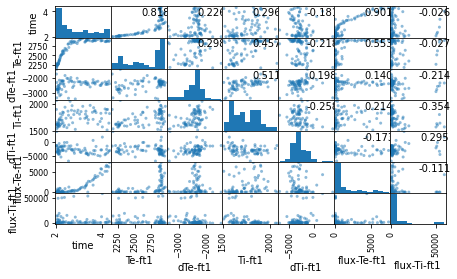

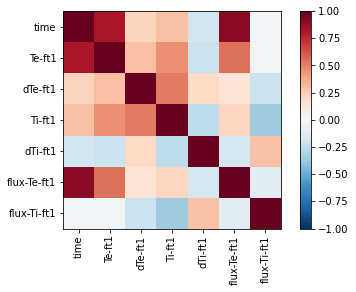

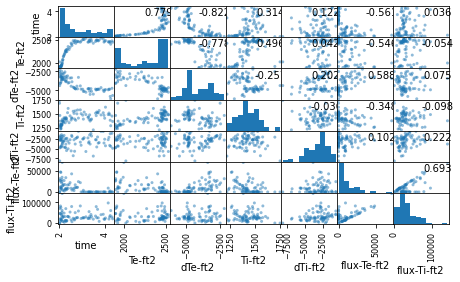

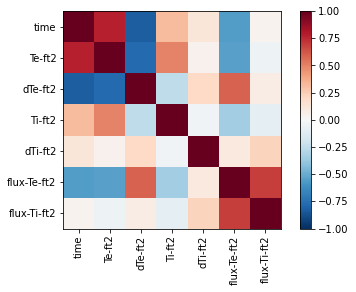

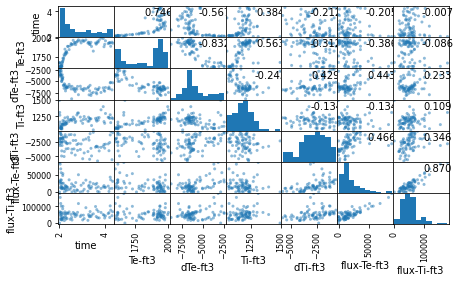

...

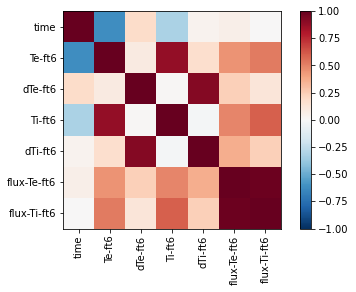

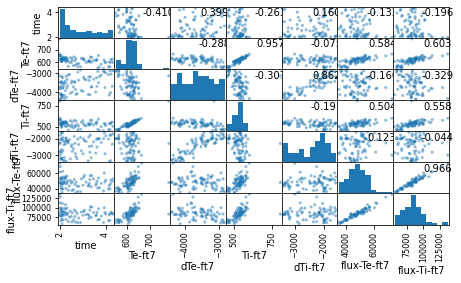

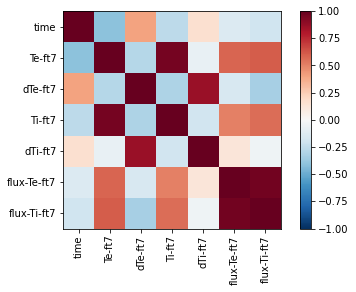

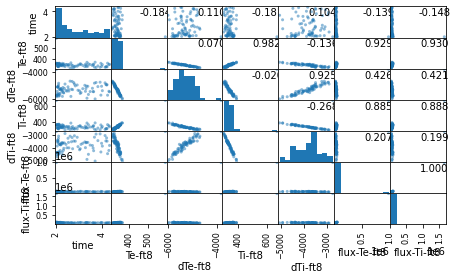

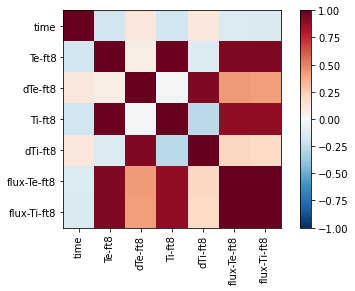

In [6]:
plot_correlations(AUG_gem.iloc[::100], active_t)

## Plot the correlations for the various flux tubes (starting from 4000th point, every 10th data point)

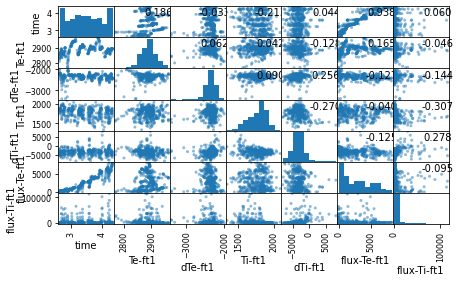

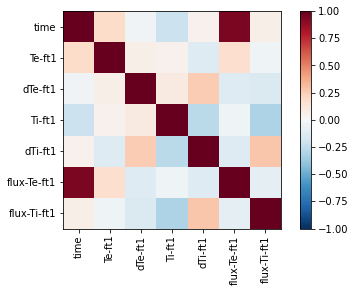

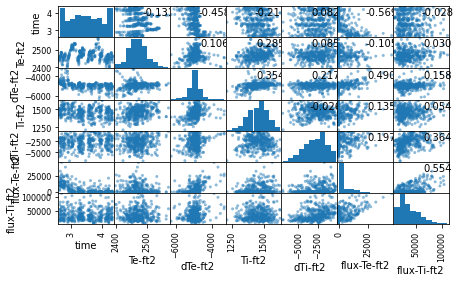

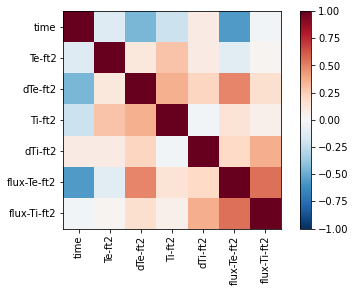

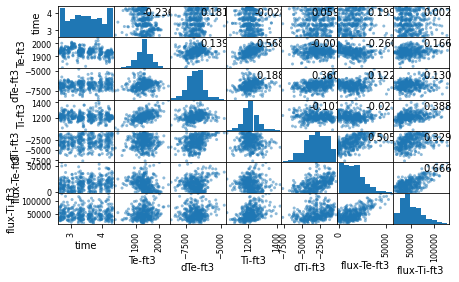

...

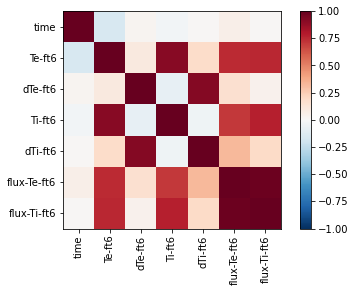

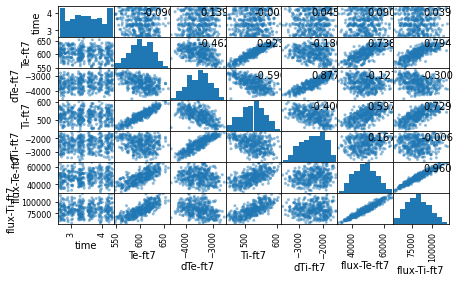

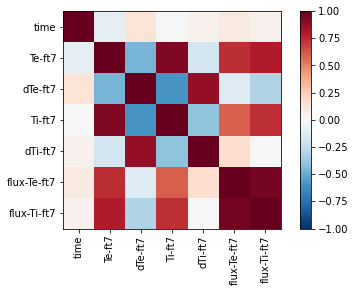

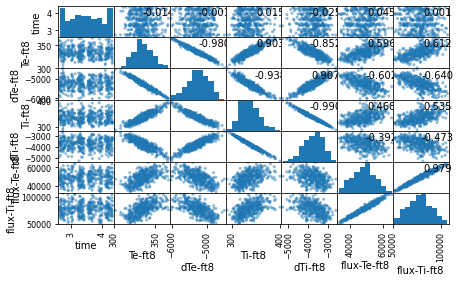

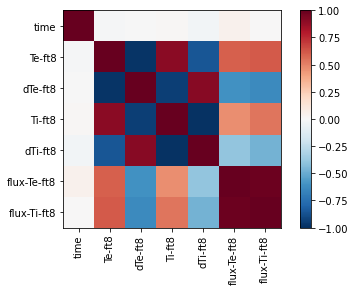

In [7]:
plot_correlations(AUG_gem.iloc[4000::10], active_t)

**Worryingly we see a trend in time for flux-Te-ft1**


## Let's plot energy fluxes, 
### Unsmoothed electron and ion energy fluxes

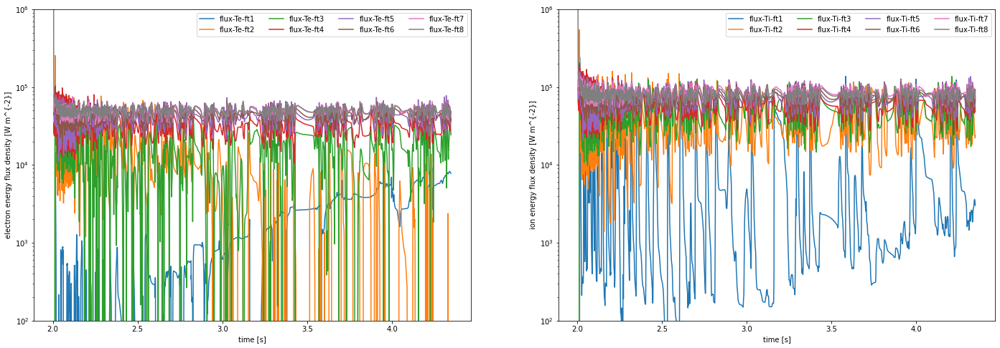

In [8]:
plot_unsmoothed(
    [{"data": AUG_gem, "style": '-'}],
    [{"cols": Te_flux_cols, "label": 'electron energy flux density [W m^{-2}]', "limit": (1e2,1e6)},
     {"cols": Ti_flux_cols, "label": 'ion energy flux density [W m^{-2}]', "limit": (1e2,1e6)}],
    logy=True)

### Smoothed electron and ion energy fluxes

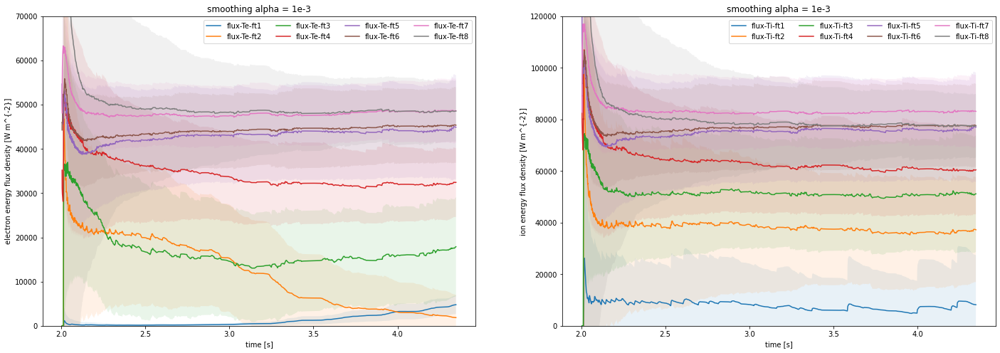

In [9]:
plot_smoothed(
    [{"data": AUG_gem, "style": '-'}],
    [{"cols": Te_flux_cols, "label": 'electron energy flux density [W m^{-2}]', "limit": (0,0.7e5)},
     {"cols": Ti_flux_cols, "label": 'ion energy flux density [W m^{-2}]', "limit": (0,1.2e5)}],
    logy=False)

## Now analyze column groups

### Te

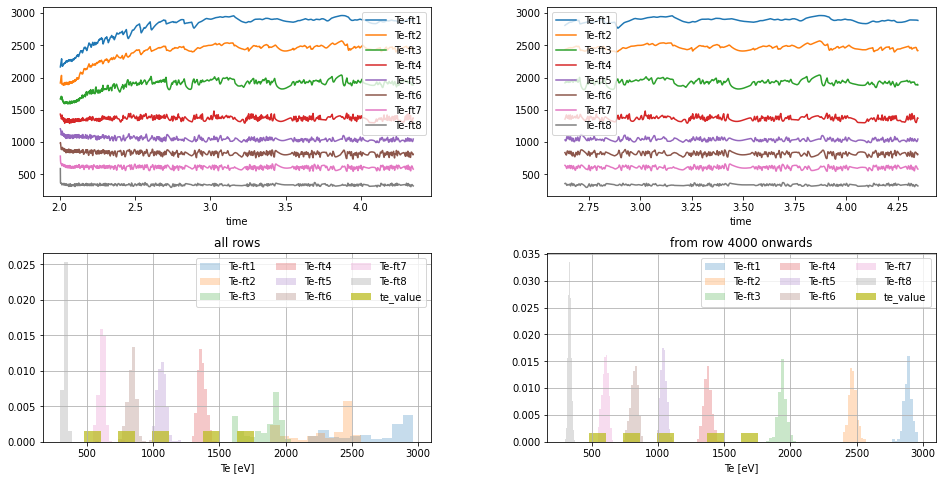

In [10]:
analyze(AUG_gem, Te_cols, G, 'te_value', 'Te [eV]', 4000)

* from about 4000 onwards Te is in a quasi steady-state
* the Te choices for the UQ are too wide for a single flux tube
  * but not wide enough for all of the flux tubes 
  (which wouldn't make sense since other things also change)

### d/drho Te

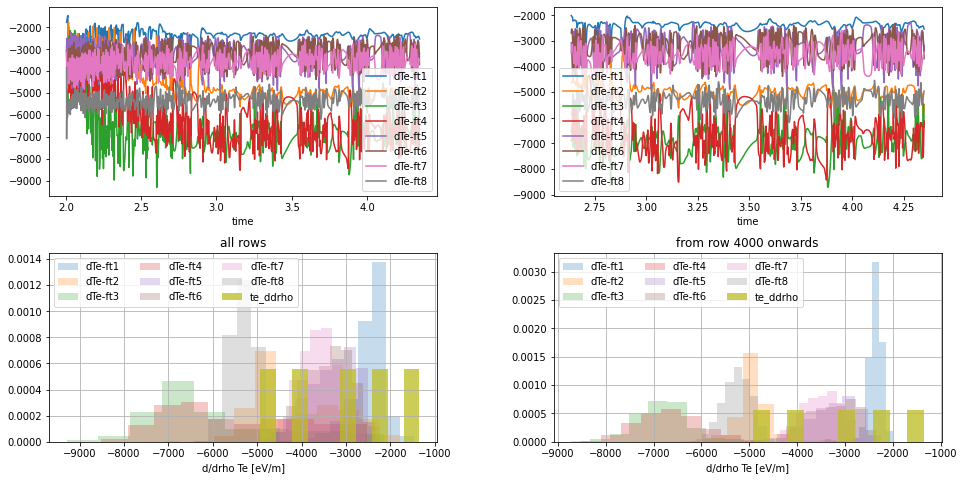

In [11]:
analyze(AUG_gem, dTe_cols, G, 'te_ddrho', 'd/drho Te [eV/m]', 4000)

* dTe is much noisier than Te!
* from about 4000 onwards Te is in a quasi steady-state
* the dTe choices seem to be a bit narrow given the noise levels

### Ti

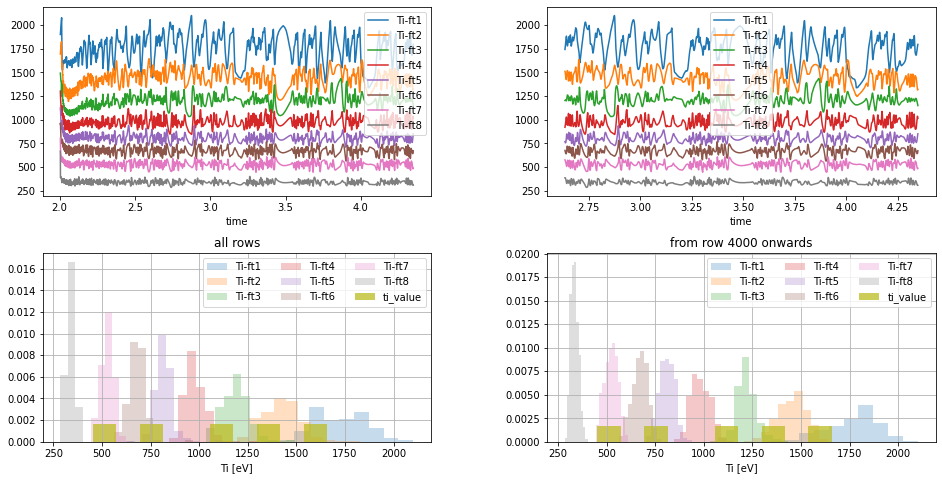

In [12]:
analyze(AUG_gem, Ti_cols, G, 'ti_value', 'Ti [eV]', 4000)

* Ti seems to be noisier than Te (limiting only applied to Te?)
* from about 4000 onwards Ti is in a quasi steady-state
* the Ti choices for the UQ are too wide for a single flux tube
  * but not wide enough for all of the flux tubes 
  (which wouldn't make sense since other things also change)

### d/drho Ti

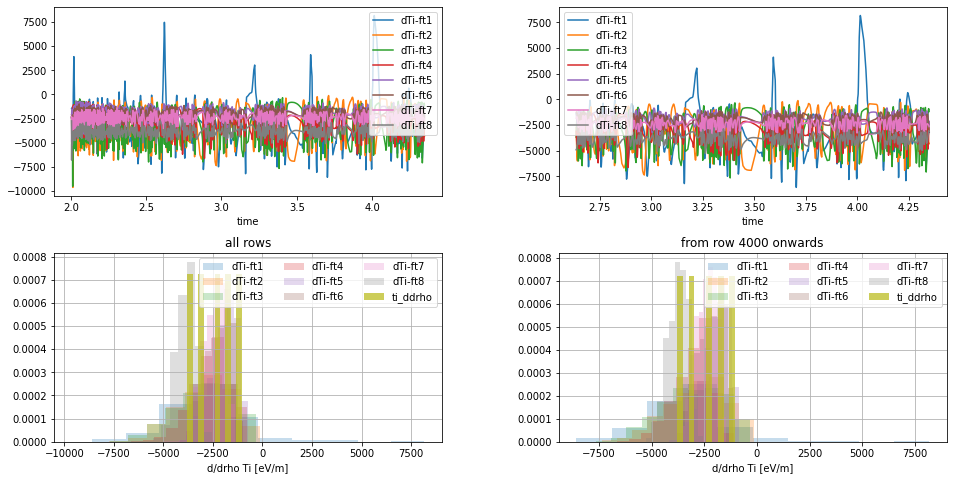

In [13]:
analyze(AUG_gem, dTi_cols, G, 'ti_ddrho', 'd/drho Ti [eV/m]', 4000)

* dTi is much noisier than Ti and dTe!
* from about 4000 onwards dTi is perhaps in a quasi steady-state
* the dTi choices seem to be a bit narrow given the noise levels
* **probably need to re-do analysis with limiting of deltas for (Te, dTe, Ti, dTi)**

# The End